# INTRODUCTION

This Jupyter Notebook is designed to demonstrate the application of causal machine learning techniques within the context of management science. Leveraging the DoWhy library, an open-source project developed by Microsoft Research, we will explore the principles and methods articulated in Judea Pearl’s Causal Inference framework.

Causal inference has become a pivotal area of study in various domains, including management science, where understanding the cause-and-effect relationships can significantly enhance decision-making processes and strategic planning. Judea Pearl’s framework provides a structured approach to discern causality from data, emphasizing the importance of causal diagrams (Directed Acyclic Graphs, or DAGs) and the do-calculus for causal effect estimation.

The DoWhy library is a powerful tool that operationalizes Pearl’s framework, allowing researchers to implement and test causal assumptions directly within their data analysis workflows. By integrating DoWhy into our analysis, we can rigorously evaluate causal relationships, ensuring our inferences are robust and scientifically valid.

In this notebook, we will:

	1. Define Causal Models: Using causal diagrams to represent assumptions about the underlying data-generating processes.
	2. Identify Causal Effects: Employing do-calculus and other identification strategies to establish the relationships between variables.
	3. Estimate Causal Effects: Utilizing statistical and machine learning techniques to estimate the magnitude of causal relationships.
	4. Refute and Validate Causal Inferences: Conducting robustness checks and sensitivity analyses to validate the credibility of our causal claims.

Through this structured approach, we aim to provide a comprehensive understanding of how causal machine learning can be applied to address complex management science problems, ultimately contributing to more informed and effective managerial decisions.

References:

	• Pearl, J. (2009). Causality: Models, Reasoning, and Inference (2nd ed.). Cambridge University Press.
	• Microsoft Research. (n.d.). DoWhy Documentation. Retrieved from https://github.com/microsoft/dowhy

# 1. Setup & Global Definitions

In [2]:
!pip install dowhy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 383.4/383.4 kB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 174.5/174.5 kB 7.8 MB/s eta 0:00:00


In [3]:
!pip install econml

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 13.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 532.9/532.9 kB 18.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 237.3/237.3 kB 8.4 MB/s eta 0:00:00


In [24]:
# Importing necessary libraries for data manipulation, visualization, and causal inference
import pandas as pd # DataFrame manipulation
import numpy as np # Numerical operations
import matplotlib.pyplot as plt # Plotting
import seaborn as sns # Enhanced plotting
from statsmodels.stats.oaxaca import OaxacaBlinder
import statsmodels.api as sm # Statistical models
from lightgbm import LGBMRegressor

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestRegressor

import dowhy
import dowhy.gcm as gcm
from dowhy import CausalModel
from dowhy.gcm.falsify import FalsifyConst, falsify_graph, plot_local_insights, run_validations, apply_suggestions
import dowhy.causal_estimators.linear_regression_estimator
from dowhy.gcm.uncertainty import estimate_variance

import networkx as nx
import pydot
from IPython.display import Image, display

import graphviz
from sklearn.preprocessing import LabelEncoder

import warnings # control warnings output
warnings.filterwarnings('ignore')

from tqdm import tqdm

In [25]:
fontsize_plot = 9

In [26]:
def view_pydot(pdot):
    plt = Image(pdot.create_png())
    display(plt)

# 2. Data Preparation
I this notebook, we will utilize the analysis of the gender wage gap as a case study to demonstrate the application of causal machine learning techniques using the DoWhy library. The gender wage gap is a critical issue in management science, as it highlights disparities in income between different gender groups, which can have profound implications for organizational policies and societal equity.

To conduct this analysis, we will use data from the Panel Survey of Income Dynamics (PSID), a longitudinal household survey conducted in the United States. The PSID provides a rich dataset with detailed information on income, employment, and demographic characteristics, making it an ideal source for investigating the factors contributing to the gender wage gap. We use data from the 2021 PSID available for free at: https://simba.isr.umich.edu/data/data.aspx

In order to provide an efficient setup, the repository includes a pre-processed file in csv format, that includes all variables of interest for the following analysis: "psid_main.csv"

In [182]:
# Loading the dataset from a CSV file and displaying the first few rows
psid_main = pd.read_csv('https://raw.githubusercontent.com/rudi-mac/causalml/main/psid_main.csv', index_col=0)
psid_main

,Gender_Male,Ethnicity,Union_Part,Region,Prof_Experience_tot,Prof_Experience_ft,Education_Yrs,College_Degree,Bachelor_Degree,Masters_Degree,...,Born_Foreign,Childcare_Hrs,Hourly_Salary,Main_Occupation,Main_Industry,Ref_Person,Occ_Category,Ind_Category,diff_prof_exp,Prof_Experience
0,False,White,False,South,39.0,30.0,12,False,False,False,...,0,0.0,2.500000,4110,8680,True,Food Preparation and Serving Related Occupations,Accommodations and Food Services,9.0,34.5
1,True,White,False,North Central,18.0,13.0,12,False,False,False,...,0,0.0,16.666667,6240,770,True,Construction and Extraction Occupations,Construction,5.0,15.5
2,True,White,False,South,7.0,4.0,12,False,False,False,...,0,0.0,16.500000,1560,7290,True,Architecture and Engineering Occupations,"Professional, Scientific, and Technical Services",3.0,5.5
3,False,White,False,South,5.0,4.0,12,False,False,False,...,0,140.0,12.500000,4610,8370,True,Personal Care and Service Occupations,Health Care and Social Assistance,1.0,4.5
4,True,White,False,South,5.0,5.0,12,False,False,False,...,0,0.0,24.960000,4700,5380,True,Sales and Related Occupations,Retail Trade,0.0,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4681,False,Black,False,West,4.0,4.0,16,False,False,False,...,0,0.0,28.000000,430,7390,False,Management Occupations,"Professional, Scientific, and Technical Services",0.0,4.0
4682,False,Black,False,South,2.0,1.0,12,False,False,False,...,0,0.0,12.000000,4720,5090,False,Sales and Related Occupations,Retail Trade,1.0,1.5
4683,False,Black,False,South,15.0,10.0,12,False,False,False,...,0,0.0,19.750000,3649,8180,False,Healthcare Support Occupations,Health Care and Social Assistance,5.0,12.5
4684,False,Black,False,South,4.0,4.0,12,False,False,False,...,0,20.0,20.000000,3420,4970,False,Healthcare Practitioners and Technical Occupat...,Retail Trade,0.0,4.0


In [117]:
# Displaying basic information about the dataset, such as the number of entries and data types
psid_main.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4665 entries, 0 to 4685
Data columns (total 22 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Gender_Male          4665 non-null   bool   
 1   Ethnicity            4665 non-null   object 
 2   Union_Part           4665 non-null   bool   
 3   Region               4665 non-null   object 
 4   Prof_Experience_tot  4665 non-null   float64
 5   Prof_Experience_ft   4665 non-null   float64
 6   Education_Yrs        4665 non-null   int64  
 7   College_Degree       4665 non-null   bool   
 8   Bachelor_Degree      4665 non-null   bool   
 9   Masters_Degree       4665 non-null   bool   
 10  Educ_Mother          4665 non-null   int64  
 11  Educ_Father          4665 non-null   int64  
 12  Born_Foreign         4665 non-null   int64  
 13  Childcare_Hrs        4665 non-null   float64
 14  Hourly_Salary        4665 non-null   float64
 15  Main_Occupation      4665 non-null   int64 

In [118]:
psid_main.Educ_Father.describe()

count    4665.000000
mean        4.891961
std         1.709344
min         1.000000
25%         4.000000
50%         4.000000
75%         6.000000
max         8.000000
Name: Educ_Father, dtype: float64

## Convert Dataset to Numerical Values

In [121]:
# In order to perform the Oaxaca - Blinder decomposition, we need to convert categorical variables into one-hot encoded data
# Furthermore, we use the logarithm of salary to account for distribution skewness (e.g., https://kenbenoit.net/assets/courses/ME104/logmodels2.pdf#:~:text=URL%3A%20https%3A%2F%2Fkenbenoit.net%2Fassets%2Fcourses%2FME104%2Flogmodels2.pdf%0AVisible%3A%200%25%20)
psid_main_num = psid_main[['Gender_Male', 'Union_Part','Prof_Experience', 'Education_Yrs','Hourly_Salary','College_Degree','Masters_Degree','Bachelor_Degree','Childcare_Hrs','Born_Foreign']].copy()
# one-hot encoding of categorical variables
psid_main_num = pd.concat([psid_main_num, pd.get_dummies(psid_main.Ethnicity, dtype=int)], axis=1)
psid_main_num = pd.concat([psid_main_num, pd.get_dummies(psid_main.Region, dtype=int)], axis=1)
psid_main_num = pd.concat([psid_main_num, pd.get_dummies(psid_main.Occ_Category, dtype=int)], axis=1)
psid_main_num = pd.concat([psid_main_num, pd.get_dummies(psid_main.Ind_Category, dtype=int)], axis=1)
psid_main_num = pd.concat([psid_main_num, pd.get_dummies(psid_main.Educ_Father, dtype=int)], axis=1)
psid_main_num = psid_main_num.rename(columns={1:'Father_0-5_grades',2:'Father_6-8_grades',3:'Father_9-11_grades',4:'Father_12_grades',5:'Father_12_grades_plus',6:'Father_Some_college',7:'Father_College_BA ',8:'Father_College_advanced'})
psid_main_num = pd.concat([psid_main_num, pd.get_dummies(psid_main.Educ_Mother, dtype=int)], axis=1)
psid_main_num = psid_main_num.rename(columns={1:'Mother_0-5_grades',2:'Mother_6-8_grades',3:'Mother_9-11_grades',4:'Mother_12_grades',5:'Mother_12_grades_plus',6:'Mother_Some_college',7:'Mother_College_BA ',8:'Mother_College_advanced'})

# remove one column per category to avoid "dummy trap"
psid_main_num = psid_main_num.drop(['Other','South','Farming, Fishing, and Forestry Occupations','Mining, Quarrying, and Oil and Gas Extraction','Father_0-5_grades','Mother_0-5_grades'], axis=1)

psid_main_num['Hourly_Salary_log'] = np.log(psid_main_num['Hourly_Salary'] )
psid_main_num['Gender_Male'] = psid_main_num['Gender_Male'].astype(int)
psid_main_num['Union_Part'] = psid_main_num['Union_Part'].astype(int)
psid_main_num['College_Degree'] = psid_main_num['College_Degree'].astype(int)
psid_main_num['Masters_Degree'] = psid_main_num['Masters_Degree'].astype(int)
psid_main_num['Bachelor_Degree'] = psid_main_num['Bachelor_Degree'].astype(int)

In [122]:
psid_main_num.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4665 entries, 0 to 4685
Data columns (total 75 columns):
 #   Column                                                                 Non-Null Count  Dtype  
---  ------                                                                 --------------  -----  
 0   Gender_Male                                                            4665 non-null   int64  
 1   Union_Part                                                             4665 non-null   int64  
 2   Prof_Experience                                                        4665 non-null   float64
 3   Education_Yrs                                                          4665 non-null   int64  
 4   Hourly_Salary                                                          4665 non-null   float64
 5   College_Degree                                                         4665 non-null   int64  
 6   Masters_Degree                                                         4665 non-null   int64 

# 3. DESCRIPTIVES

In [123]:
# Mean hourly salaries for men vs. women (a.k.a. "Naive estimate" or "Unconditional average predictive effect" in the Pearlian framework)
print(psid_main[['Gender_Male', 'Hourly_Salary']].groupby('Gender_Male').mean())

             Hourly_Salary
Gender_Male               
False            25.481282
True             33.416870


Text(0.5, 1.1, 'Demographics')

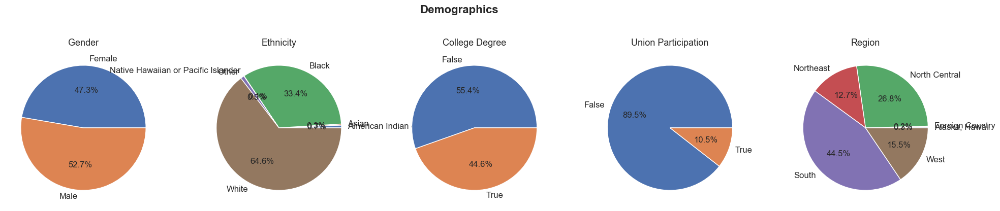

In [124]:
# Some charts representing the demographics of the dataset analyzed
sns.set_theme(context='notebook', style='white')
fig, axes = plt.subplots(1, 5, figsize=(24,4), sharey=False)
psid_main.groupby('Gender_Male').size().plot(kind='pie', autopct='%.1f%%', fontsize=12, ax=axes[0], labels=['Female', 'Male'])
psid_main.groupby('Ethnicity').size().plot(kind='pie', autopct='%.1f%%', fontsize=12, ax=axes[1])
psid_main.groupby('College_Degree').size().plot(kind='pie', autopct='%.1f%%', fontsize=12, ax=axes[2])
psid_main.groupby('Union_Part').size().plot(kind='pie', autopct='%.1f%%', fontsize=12, ax=axes[3])
psid_main.groupby('Region').size().plot(kind='pie', autopct='%.1f%%', fontsize=12, ax=axes[4])
axes[0].set_title('Gender', fontsize=13)
axes[1].set_title('Ethnicity', fontsize=13)
axes[2].set_title('College Degree', fontsize=13)
axes[3].set_title('Union Participation', fontsize=13)
axes[4].set_title('Region', fontsize=13)
fig.set_facecolor('white')
fig.suptitle('Demographics', ha='center', fontsize=16, weight='bold', y=1.1)

In [125]:
psid_main['Hourly_Salary'].describe().reset_index().merge(psid_main[psid_main['Gender_Male']==True]['Hourly_Salary'].describe().reset_index(), left_index=True, right_index=True).merge(psid_main[psid_main['Gender_Male']==False]['Hourly_Salary'].describe().reset_index(), left_index=True, right_index=True).drop(['index_y','index_x'], axis=1).rename({'Hourly_Salary_x':'Total Population','Hourly_Salary_y':'Male Subpopulation','Hourly_Salary':'Female Subpopulation'},axis=1).set_index('index')

,Total Population,Male Subpopulation,Female Subpopulation
index,,,
count,4665.000000,2458.000000,2207.000000
mean,29.662563,33.416870,25.481282
std,35.934371,38.314415,32.585982
min,0.167000,2.008929,0.167000
25%,16.000000,17.500000,15.000000
50%,22.000000,25.000000,19.236058
75%,33.600000,37.500000,28.149038
max,750.000000,750.000000,700.000000


In [126]:
gpg = round((np.mean(psid_main[psid_main['Gender_Male']==True].Hourly_Salary)-np.mean(psid_main[psid_main['Gender_Male']==False].Hourly_Salary)) / np.mean(psid_main[psid_main['Gender_Male']==True].Hourly_Salary) *100,2)
print('The mean gender pay gap is (GPG): ', gpg,'%')
print('On average, men earn', gpg, '% more than women')

The mean gender pay gap is (GPG):  23.75 %
On average, men earn 23.75 % more than women


In [127]:
print('The Unadjusted log hourly wage ratio is: ', round(np.exp(
    np.mean(np.log(psid_main[psid_main['Gender_Male'] == False].Hourly_Salary)) - np.mean(
        np.log(psid_main[psid_main['Gender_Male'] == True].Hourly_Salary))) * 100, 2), '%')


The Unadjusted log hourly wage ratio is:  78.61 %


## Gender Wage Gap per Industry

In [128]:
round(np.exp(np.mean(np.log(psid_main[psid_main['Gender_Male'] == False].Hourly_Salary)) - np.mean(np.log(psid_main[psid_main['Gender_Male'] == True].Hourly_Salary))) * 100, 2)

In [129]:
log_mean_salaries = psid_main[['Ind_Category', 'Gender_Male','Hourly_Salary']].copy()
log_mean_salaries['Hourly_Salary'] = np.log(log_mean_salaries['Hourly_Salary'])
log_mean_salaries = log_mean_salaries.groupby(['Ind_Category', 'Gender_Male'])['Hourly_Salary'].mean().unstack()
log_mean_salaries['Log_Wage_Gap'] = round(np.exp(log_mean_salaries[False] - log_mean_salaries[True])*100,2)
log_mean_salaries.drop(columns={True,False},axis=1)

Gender_Male,Log_Wage_Gap
Ind_Category,
Accommodations and Food Services,77.71
"Agriculture, Forestry, Fishing, and Hunting",131.45
"Arts, Entertainment, and Recreation",93.13
Construction,87.33
Educational Services,88.85
Finance and Insurance,64.10
Health Care and Social Assistance,75.01
Information,64.57
"Management, Administrative and Support, and Waste Management Services",93.83


## Visualizations of the Gender Wage Gap

We want to first get an understanding of the extent of the gender wage gap within different occupational categories. The PSID dataset includes a total of 23 different occupational categories.

([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22],
 [Text(0, 0, 'Architecture and Engineering Occupations'),
  Text(1, 0, 'Arts, Design, Entertainment, Sports, and Media Occupations'),
  Text(2, 0, 'Building and Grounds Cleaning and Maintenance Occupations'),
  Text(3, 0, 'Business and Financial Operations Occupations'),
  Text(4, 0, 'Community and Social Services Occupations'),
  Text(5, 0, 'Computer and Mathematical Occupations'),
  Text(6, 0, 'Construction and Extraction Occupations'),
  Text(7, 0, 'Education, Training, and Library Occupations'),
  Text(8, 0, 'Farming, Fishing, and Forestry Occupations'),
  Text(9, 0, 'Food Preparation and Serving Related Occupations'),
  Text(10, 0, 'Healthcare Practitioners and Technical Occupations'),
  Text(11, 0, 'Healthcare Support Occupations'),
  Text(12, 0, 'Installation, Maintenance, and Repair Occupations'),
  Text(13, 0, 'Legal Occupations'),
  Text(14, 0, 'Lif

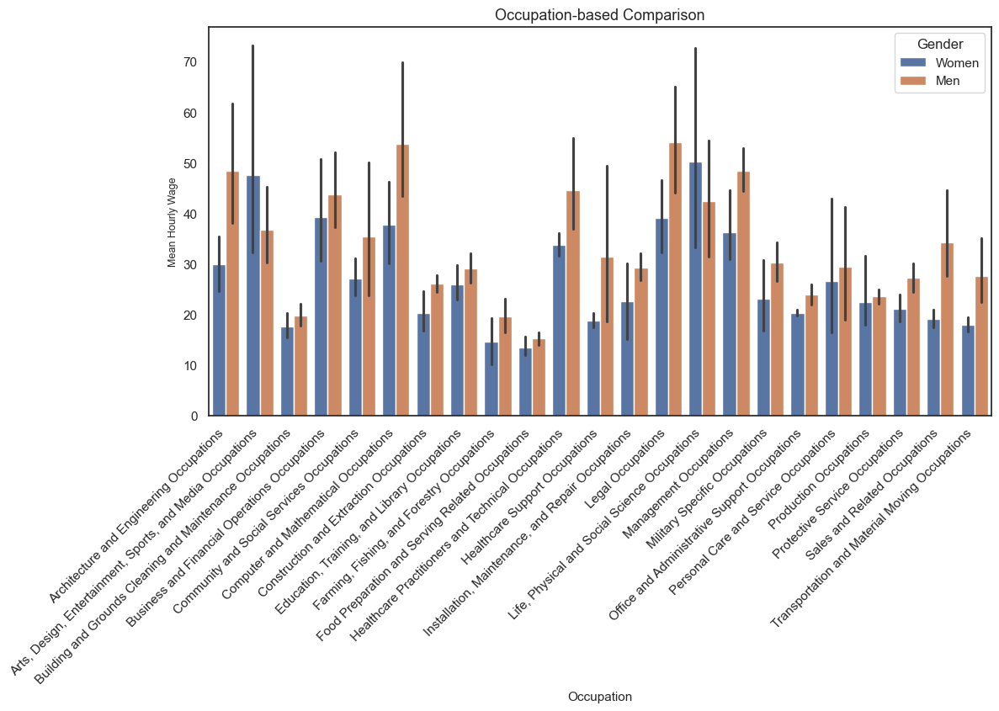

In [130]:
alpha_order = np.sort(psid_main['Occ_Category'].unique()).tolist()

plt.figure(figsize=(12,6))
ax = sns.barplot(psid_main, y='Hourly_Salary', x='Occ_Category', hue='Gender_Male', order=alpha_order, palette='deep')
labels=['Women','Men']
h, l = ax.get_legend_handles_labels()
ax.legend(h, labels, title="Gender")
ax.set_ylabel('Mean Hourly Wage', fontsize=fontsize_plot)
ax.set_xlabel('Occupation', fontsize=fontsize_plot+2)
ax.set_title("Occupation-based Comparison", fontsize=fontsize_plot+4)
plt.xticks(rotation=45,ha='right')

By plotting the mean hourly wage for women vs. men in different occupational categories, we see that there are only two categories (i.e., "Arts, Design, Entertainment, Sports, and Media Occupations", & "Life, Physical and Social Science Occupations"), in which women experience a higher average value compared to men.

In [131]:
occ_list = psid_main.Occ_Category.unique()
pay_gap_occ = pd.DataFrame(index=occ_list)
for idx,row in pay_gap_occ.iterrows():

    gpg_occ = round(np.exp(np.mean(np.log(psid_main[(psid_main['Gender_Male']==False)&(psid_main['Occ_Category']==idx)].Hourly_Salary))-np.mean(np.log(psid_main[(psid_main['Gender_Male']==True)&(psid_main['Occ_Category']==idx)].Hourly_Salary)))*100,2)
    pay_gap_occ.loc[idx,'Pay Gap'] = gpg_occ

In [132]:
pay_gap_occ.sort_index()

,Pay Gap
Architecture and Engineering Occupations,71.24
"Arts, Design, Entertainment, Sports, and Media Occupations",123.00
Building and Grounds Cleaning and Maintenance Occupations,90.92
Business and Financial Operations Occupations,81.85
Community and Social Services Occupations,97.58
Computer and Mathematical Occupations,76.90
Construction and Extraction Occupations,81.80
"Education, Training, and Library Occupations",84.22
"Farming, Fishing, and Forestry Occupations",75.62
Food Preparation and Serving Related Occupations,81.64


We want to do the same analysis for different industries.

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18],
 [Text(0, 0, 'Accommodations and Food Services'),
  Text(1, 0, 'Agriculture, Forestry, Fishing, and Hunting'),
  Text(2, 0, 'Arts, Entertainment, and Recreation'),
  Text(3, 0, 'Construction'),
  Text(4, 0, 'Educational Services'),
  Text(5, 0, 'Finance and Insurance'),
  Text(6, 0, 'Health Care and Social Assistance'),
  Text(7, 0, 'Information'),
  Text(8, 0, 'Management, Administrative and Support, and Waste Management Services'),
  Text(9, 0, 'Manufacturing'),
  Text(10, 0, 'Mining, Quarrying, and Oil and Gas Extraction'),
  Text(11, 0, 'Other Services (Except Public Administration)'),
  Text(12, 0, 'Professional, Scientific, and Technical Services'),
  Text(13, 0, 'Public Administration and Active Duty Military'),
  Text(14, 0, 'Real Estate and Rental and Leasing'),
  Text(15, 0, 'Retail Trade'),
  Text(16, 0, 'Transportation and Warehousing'),
  Text(17, 0, 'Utilities'),
  Text(18, 0, 'Wholesale Trade')])

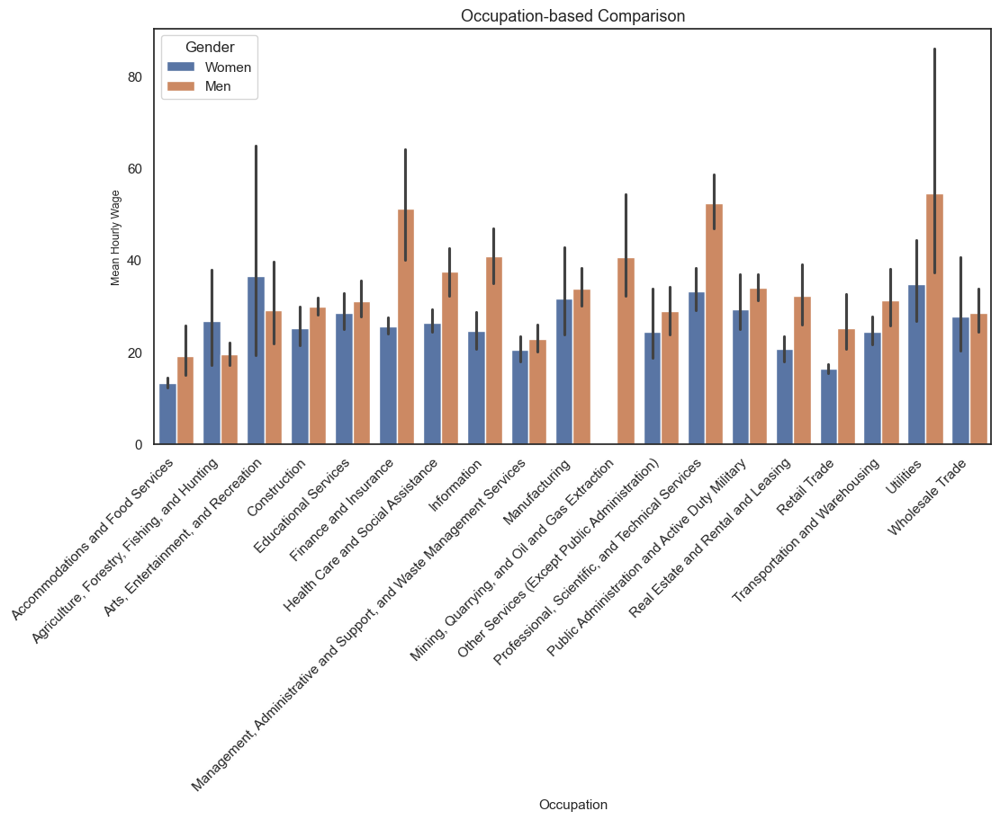

In [133]:
alpha_order = np.sort(psid_main['Ind_Category'].unique()).tolist()

plt.figure(figsize=(12,6))
ax = sns.barplot(psid_main, y='Hourly_Salary', x='Ind_Category', hue='Gender_Male', order=alpha_order, palette='deep')
labels=['Women','Men']
h, l = ax.get_legend_handles_labels()
ax.legend(h, labels, title="Gender")
ax.set_ylabel('Mean Hourly Wage', fontsize=fontsize_plot)
ax.set_xlabel('Occupation', fontsize=fontsize_plot+2)
ax.set_title("Occupation-based Comparison", fontsize=fontsize_plot+4)
plt.xticks(rotation=45,ha='right')

## Human Capital Descriptives

In [134]:
# Compute and display the descriptives related to human capital attainment for women vs. men
pd.concat([psid_main.groupby('Gender_Male').agg({'Prof_Experience': ['count', 'mean', 'std']}).transpose(),psid_main.groupby('Gender_Male').agg({'Education_Yrs':['count','mean','std']}).transpose(),psid_main.groupby('Gender_Male').agg({'College_Degree':['count','sum']}).transpose()]).rename({'False':'Women','True':'Men'},axis='columns')

Gender_Male                  False        True 
Prof_Experience count  2207.000000  2458.000000
                mean      9.557318     9.280716
                std       7.996316     7.609285
Education_Yrs   count  2207.000000  2458.000000
                mean     14.333484    14.270138
                std       1.977956     2.031561
College_Degree  count  2207.000000  2458.000000
                sum     972.000000  1108.000000

In [135]:
psid_main.groupby('Gender_Male').agg({'College_Degree':['count','sum']}).transpose()

Gender_Male           False  True 
College_Degree count   2207   2458
               sum      972   1108

In [136]:
# Compute and display correlations among the numerical variables
psid_main[['Gender_Male','Union_Part','Prof_Experience','Education_Yrs','Hourly_Salary']].corr(method='spearman')

,Gender_Male,Union_Part,Prof_Experience,Education_Yrs,Hourly_Salary
Gender_Male,1.000000,0.041605,-0.003190,-0.019027,0.205829
Union_Part,0.041605,1.000000,0.047173,-0.000487,0.102453
Prof_Experience,-0.003190,0.047173,1.000000,-0.047665,0.019521
Education_Yrs,-0.019027,-0.000487,-0.047665,1.000000,0.438351
Hourly_Salary,0.205829,0.102453,0.019521,0.438351,1.000000


*OBSERVATION*: Looking at the table above makes clear that on average women and men do not experience differences between human capital attainment. This dataset suggests that women even have a slight advantage when it comes to professional experience and education (both measured in years). However,

# 4. Oaxaca Blinder Decomposition

## Adjustment with Human Capital Features

In [26]:
features = ['Gender_Male','Education_Yrs','Prof_Experience','Alaska, Hawaii','Foreign Country','North Central','Northeast','West','Black','Asian','Native Hawaiian or Pacific Islander','Other']

In [27]:
male = psid_main_num[psid_main_num['Gender_Male']==1].reset_index(drop=True).drop('Gender_Male', axis=1)
female = psid_main_num[psid_main_num['Gender_Male']==0].reset_index(drop=True).drop('Gender_Male', axis=1)
Xm = male[features[1:]]
Xf = female[features[1:]]
Ym = male['Hourly_Salary_log']
Yf = female['Hourly_Salary_log']
female_model = sm.OLS(Yf, Xf).fit()
male_model = sm.OLS(Ym, Xm).fit()
Bf = female_model.params
Bm = male_model.params

In [28]:
male_mean = np.mean(Ym)
female_mean = np.mean(Yf)
gap = male_mean - female_mean
print(round(gap,6))

0.240674


$$Gap = Explained + Unexplained$$

In [29]:
pooled_model = sm.OLS(psid_main_num['Hourly_Salary_log'], psid_main_num[features]).fit()
B_star = pooled_model.params.drop('Gender_Male')

$$E = (E[X_m]-E[X_f])\beta^* $$

In [30]:
explained = np.transpose(Xm.mean() - Xf.mean()) @ np.array(Bm)
unexplained = np.transpose(Xf.mean()) @ np.array(Bm-Bf)
print(explained)
print(unexplained)

0.0020878237062870995
0.2346618673989077


In [31]:
# explained "log points" according to Blau Kahn 2017 Table 4
log_points_table = np.transpose(Xm.mean() - Xf.mean())*np.array(Bm)
log_points_table

Education_Yrs                         -0.013740
Prof_Experience                       -0.002427
Alaska, Hawaii                         0.001203
Foreign Country                       -0.000200
North Central                         -0.001584
Northeast                              0.001936
West                                   0.007908
Black                                  0.009405
Asian                                  0.000016
Native Hawaiian or Pacific Islander   -0.000224
Other                                 -0.000206
dtype: float64

$$U = E[X_m]'(\beta_m-\beta^*) + E[X_f]'(\beta^*-\beta_f) $$

In [32]:
# simulated female-to-male wage ratio
adj_hcset = round(np.exp(-1*unexplained)*100,2)
print(adj_hcset)

79.08


## Adjustment with full set

In [33]:
features = psid_main_num.drop(['Hourly_Salary_log','Hourly_Salary','College_Degree'], axis=1).columns

In [34]:
male = psid_main_num[psid_main_num['Gender_Male']==1].reset_index(drop=True).drop('Gender_Male', axis=1)
female = psid_main_num[psid_main_num['Gender_Male']==0].reset_index(drop=True).drop('Gender_Male', axis=1)
Xm = male[features[1:]]
Xf = female[features[1:]]
Ym = male['Hourly_Salary_log']
Yf = female['Hourly_Salary_log']
female_model = sm.OLS(Yf, Xf).fit()
male_model = sm.OLS(Ym, Xm).fit()
Bf = female_model.params
Bm = male_model.params

In [35]:
male_mean = np.mean(Ym)
female_mean = np.mean(Yf)
gap = female_mean - male_mean
print(round(gap,6), '/',round(np.exp(gap)*100,2),'%')

-0.240674 / 78.61 %


In [36]:
explained = np.transpose(Xm.mean() - Xf.mean()) @ np.array(Bm)
unexplained = np.transpose(Xf.mean()) @ np.array(Bm-Bf)
print(explained)
print(unexplained)

0.09517613947728766
0.142260863132808


In [37]:
# simulated female-to-male wage ration
adj_fullset = round((np.exp(-1*explained))*100,2)
print(adj_fullset)

90.92


## Comparison

In [38]:
# Prepare dataframe for comparing the results of the Oaxaca-Blinder decomposition with the two different feature sets
df_comparison = pd.DataFrame()
df_comparison.loc[0,'Unadjusted'] = round(np.exp(np.mean(np.log(psid_main[psid_main['Gender_Male']==False].Hourly_Salary))-np.mean(np.log(psid_main[psid_main['Gender_Male']==True].Hourly_Salary)))*100,2)
df_comparison.loc[0,'Adjusted - Human Capital'] = adj_hcset
df_comparison.loc[0,'Adjusted - Full Specification'] = adj_fullset

([0, 1, 2],
 [Text(0, 0, 'Unadjusted'),
  Text(1, 0, 'Adjusted - Human Capital'),
  Text(2, 0, 'Adjusted - Full Specification')])

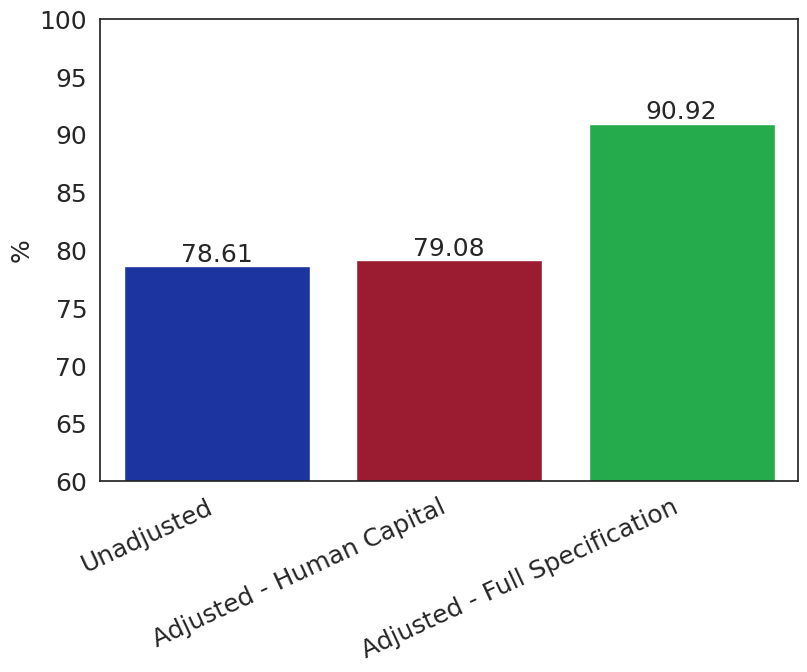

In [39]:
# Plotting the bar charts
plt.figure(figsize=(9,6))
barplt = sns.barplot(df_comparison, palette=['#0526b5','#b00723','#0ec241'])
barplt.set_ylim(60,100)
barplt.bar_label(barplt.containers[0],fontsize=18)
barplt.bar_label(barplt.containers[1],fontsize=18)
barplt.bar_label(barplt.containers[2],fontsize=18)
barplt.set_ylabel('%',fontsize=18)
plt.yticks(fontsize=18)
plt.xticks(fontsize=18,rotation=25, ha='right')

*OBSERVATION*: As described in Blau & Kahn 2017, the application of a linear decompostion method to "adjust" for human capital values, does not attribute any explanatory value to human capital features (red bar). This is related to the fact that women & men on average do not experience significant differences in human capital attainment. The green bar shows the adjusted gender wage gap using the "full specification", which includes industry and occupation. A common interpretation in literature is to treat these features as a form of self-selection, i.e., men tend to select industries and occupations that are better paid (e.g., engineering and other occupations in the field of STEM).

# 5. CAUSAL INFERENCE FRAMEWORK

## CONFIGURATION

### Define Treatment & Outcome Variables
Since the prevailing methods do not assign explanatory value to human capital features in the context of the gender wage gap, we ask the following question: Does the attainment of human capital indirectly contribute to the gender wage gap by systematically awarding higher returns on human capital for men vs. for women? In other words, does human capital theory need to account for discrimination?

In order to provide an answer to this question, we define a human capital variable, whether an individual has attained a college degree or not, as the treatment variable and consider the hourly salary as the outcome. We could also choose to do the same analysis with a continuous variable, representing human capital attainment (e.g., professional experience in years).

### Constructing the Directed Acyclic Graph (DAG)
We start of the construction of the DAG by leveraging the insight that decomposition techniques are mathematically equivalent to mediation analysis (Huber, 2015). However, since we are not interested in the (direct and indirect) effects of gender on salary, but rather the effect of human capital attainment on salary, we need to include additional confounding variables.

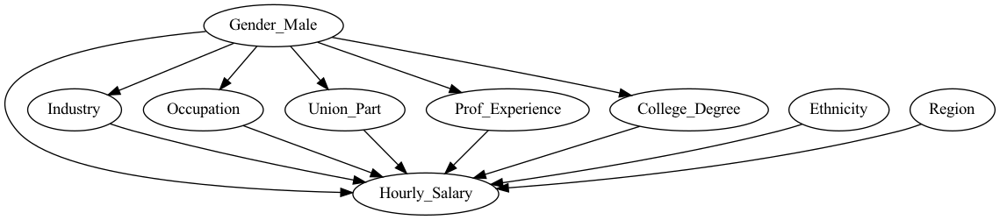

In [137]:
graph = nx.DiGraph()
graph.add_nodes_from(['Hourly_Salary', 'Gender_Male', 'Industry', 'Occupation','Ethnicity','Union_Part','Region','Prof_Experience','College_Degree'])
graph.add_edges_from([('Ethnicity','Hourly_Salary'),
                      ('Prof_Experience','Hourly_Salary'),
                      ('College_Degree','Hourly_Salary'),
                      ('Industry','Hourly_Salary'),
                      ('College_Degree','Hourly_Salary'),
                      ('Occupation','Hourly_Salary'),
                      ('Union_Part','Hourly_Salary'),
                      ('Region','Hourly_Salary'),
                      ('Gender_Male','Prof_Experience'),
                      ('Gender_Male','College_Degree'),
                      ('Gender_Male','Industry'),
                      ('Gender_Male','College_Degree'),
                      ('Gender_Male','Occupation'),
                      ('Gender_Male','Union_Part'),
                      ('Gender_Male','Hourly_Salary'),
                      ])
pdot = nx.nx_pydot.to_pydot(graph)
view_pydot(pdot)

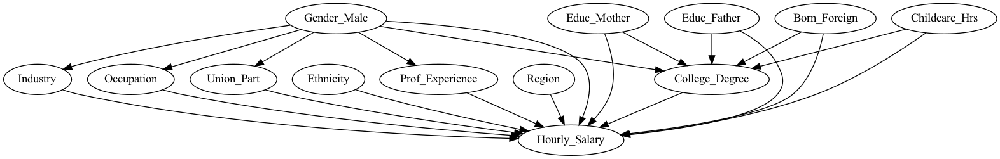

In [138]:
graph = nx.DiGraph()
graph.add_nodes_from(['Hourly_Salary', 'Gender_Male', 'Industry', 'Occupation', 'Ethnicity','Union_Part','Region','Prof_Experience','College_Degree','Educ_Mother','Educ_Father','Born_Foreign','Childcare_Hrs'])
#graph.add_nodes_from(['Family_Background'], style='dashed')
graph.add_edges_from([('Ethnicity','Hourly_Salary'),
                      ('Prof_Experience','Hourly_Salary'),
                      ('College_Degree','Hourly_Salary'),
                      ('Industry','Hourly_Salary'),
                      ('College_Degree','Hourly_Salary'),
                      ('Occupation','Hourly_Salary'),
                      ('Union_Part','Hourly_Salary'),
                      ('Region','Hourly_Salary'),
                      ('Gender_Male','Prof_Experience'),
                      ('Gender_Male','College_Degree'),
                      ('Gender_Male','Industry'),
                      ('Gender_Male','College_Degree'),
                      ('Gender_Male','Occupation'),
                      ('Gender_Male','Union_Part'),
                      ('Gender_Male','Hourly_Salary'),
                      ('Educ_Father','College_Degree'),
                      ('Educ_Mother','College_Degree'),
                      ('Born_Foreign','College_Degree'),
                      ('Educ_Father','Hourly_Salary'),
                      ('Educ_Mother','Hourly_Salary'),
                      ('Born_Foreign','Hourly_Salary'),
                      ('Childcare_Hrs','Hourly_Salary'),
                      ('Childcare_Hrs','College_Degree')
                      ])
pdot = nx.nx_pydot.to_pydot(graph)
view_pydot(pdot)

In [139]:
psid_main_num.columns

Index(['Gender_Male', 'Union_Part', 'Prof_Experience', 'Education_Yrs',
       'Hourly_Salary', 'College_Degree', 'Masters_Degree', 'Bachelor_Degree',
       'Childcare_Hrs', 'Born_Foreign', 'American Indian or Alaska Native',
       'Asian', 'Black', 'Native Hawaiian or Pacific Islander', 'White',
       'Alaska, Hawaii', 'Foreign Country', 'North Central', 'Northeast',
       'West', 'Architecture and Engineering Occupations',
       'Arts, Design, Entertainment, Sports, and Media Occupations',
       'Building and Grounds Cleaning and Maintenance Occupations',
       'Business and Financial Operations Occupations',
       'Community and Social Services Occupations',
       'Computer and Mathematical Occupations',
       'Construction and Extraction Occupations',
       'Education, Training, and Library Occupations',
       'Food Preparation and Serving Related Occupations',
       'Healthcare Practitioners and Technical Occupations',
       'Healthcare Support Occupations',
       '

In [140]:
common_causes = ['Gender_Male', 'Childcare_Hrs','Born_Foreign',  'Father_6-8_grades', 'Father_9-11_grades',
                 'Father_12_grades', 'Father_12_grades_plus', 'Father_Some_college',
                 'Father_College_BA ', 'Father_College_advanced',
                 'Mother_6-8_grades', 'Mother_9-11_grades', 'Mother_12_grades',
                 'Mother_12_grades_plus', 'Mother_Some_college', 'Mother_College_BA ',
                 'Mother_College_advanced']


## IMPLEMETATION

### Bachelor Degree

In [160]:
# Define Model, observational data, treatment and outcome variables
model = CausalModel(data=psid_main_num, treatment='Bachelor_Degree', outcome='Hourly_Salary_log',
                    common_causes=common_causes)
model.summary()

"Model to find the causal effect of treatment ['Bachelor_Degree'] on outcome ['Hourly_Salary_log']"

In [161]:
model.get_common_causes()

['Gender_Male',
 'Mother_9-11_grades',
 'Father_College_advanced',
 'Father_12_grades_plus',
 'Father_6-8_grades',
 'Mother_12_grades',
 'Father_9-11_grades',
 'Father_Some_college',
 'Father_College_BA ',
 'Childcare_Hrs',
 'Mother_6-8_grades',
 'Mother_Some_college',
 'Father_12_grades',
 'Mother_College_BA ',
 'Born_Foreign',
 'Mother_12_grades_plus',
 'Mother_College_advanced']

In [162]:
model.get_effect_modifiers()

In [163]:
estimand = model.identify_effect()

In [164]:
ATE_bachelor = model.estimate_effect(estimand, method_name='backdoor.econml.dml.LinearDML',
                                        confidence_intervals=False, test_significance=True,
                                        target_units='ate',
                                  method_params={
                                      'init_params':{
                                          'model_y': LGBMRegressor(n_estimators=50, num_leaves=2^10, max_depth=10, verbosity=-1),
                                          'model_t': LGBMRegressor(n_estimators=50, num_leaves=2^10, max_depth=10, verbosity=-1),
                                          'discrete_treatment': False,
                                          'cv': 4
                                        },
                                      'fit_params':{}
                                  },
                                  )

In [165]:
print('Expected increase in salary (on average):',round((np.exp(ATE_bachelor.value.mean()) - 1) * 100,2), '% /',ATE_bachelor.test_stat_significance())

Expected increase in salary (on average): 27.77 % / {'p_value': (0, 0.001)}


In [167]:
interaction_df = pd.DataFrame(model._common_causes, columns=['Interaction Variable'])
interaction_df = interaction_df[interaction_df['Interaction Variable']!='Childcare_Hrs'].reset_index(drop=True) # dropping childcare hours since it is continuous
interaction_df['CATE_%'] = np.zeros(interaction_df.shape[0])
interaction_df['pvalue'] = np.zeros(interaction_df.shape[0])
interaction_df['Std_Err'] = np.zeros(interaction_df.shape[0])

In [168]:
def estimate_cate_categorical(interaction_variable) :
    cate = model.estimate_effect(estimand, method_name='backdoor.econml.dml.LinearDML',
                                 confidence_intervals=False,
                                 test_significance=True,
                                 target_units=lambda df: (df[interaction_variable]==1),
                                 method_params={
                                     'init_params':{
                                         'model_y': LGBMRegressor(n_estimators=50, num_leaves=2^10, max_depth=10, verbosity=-1),
                                         'model_t': LGBMRegressor(n_estimators=50, num_leaves=2^10, max_depth=10, verbosity=-1),
                                         'discrete_treatment': True,
                                         'cv': 4
                                     },
                                     'fit_params':{}
                                 },
                                 )

    effect = round(np.exp(cate.cate_estimates.mean()) - 1, 4) * 100
    sign = cate.test_stat_significance()

    try:
        stand_err = round(np.exp(cate.get_standard_error()) - 1,4)*100
    except ValueError:
        stand_err = np.nan

    return (effect, sign, stand_err)

In [169]:
# run the loop
with tqdm(total=interaction_df.shape[0]) as pbar:

    for idx, row in interaction_df.iterrows():
        pbar.update(1)

        cate = estimate_cate_categorical(row['Interaction Variable'])

        interaction_df.loc[idx, 'CATE_%'] = cate[0]
        interaction_df.loc[idx, 'Std_Err'] = cate[2]

        try:
            interaction_df.loc[idx, 'pvalue'] = cate[1]['p_value']
        except ValueError:
            interaction_df.loc[idx, 'pvalue'] = cate[1]['p_value'][1]

        interaction_df.to_csv('/Users/rudolfm/Documents - MTEC-SMI-322/Papers/Methods_Paper_CausalML/Data_Analysis/cate_results_bachelor.csv')

100%|██████████| 16/16 [52:53<00:00, 198.36s/it]


In [176]:
interaction_df_BA = pd.read_csv('/Users/rudolfm/Documents - MTEC-SMI-322/Papers/Methods_Paper_CausalML/Data_Analysis/cate_results_bachelor.csv')

In [177]:
interaction_df_BA

,Unnamed: 0,Interaction Variable,CATE_%,pvalue,Std_Err
0,0,Gender_Male,27.20,0.001,2.12
1,1,Mother_9-11_grades,27.37,0.001,2.16
2,2,Father_College_advanced,27.74,0.001,2.12
3,3,Father_12_grades_plus,27.75,0.001,2.17
4,4,Father_6-8_grades,27.80,0.001,2.26
5,5,Mother_12_grades,27.22,0.001,2.15
6,6,Father_9-11_grades,27.87,0.001,2.10
7,7,Father_Some_college,27.78,0.001,2.21
8,8,Father_College_BA,27.87,0.001,2.15
9,9,Mother_6-8_grades,27.70,0.001,2.17


### Master Degree

In [170]:
# Define Model, observational data, treatment and outcome variables
model = CausalModel(data=psid_main_num, treatment='Masters_Degree', outcome='Hourly_Salary_log',
                    common_causes=common_causes)
model.summary()

"Model to find the causal effect of treatment ['Masters_Degree'] on outcome ['Hourly_Salary_log']"

In [171]:
estimand = model.identify_effect()

In [172]:
ATE_master = model.estimate_effect(estimand, method_name='backdoor.econml.dml.LinearDML',
                            confidence_intervals=False, test_significance=True,
                            target_units='ate',
                            method_params={
                                'init_params':{
                                    'model_y': LGBMRegressor(n_estimators=50, num_leaves=2^10, max_depth=10, verbosity=-1),
                                    'model_t': LGBMRegressor(n_estimators=50, num_leaves=2^10, max_depth=10, verbosity=-1),
                                    'discrete_treatment': False,
                                    'cv': 4
                                },
                                'fit_params':{}
                            },
                            )

In [173]:
print('Expected increase in salary (on average):',round((np.exp(ATE_master.value.mean()) - 1) * 100,2), '% /',ATE_master.test_stat_significance())

Expected increase in salary (on average): 48.63 % / {'p_value': (0, 0.001)}


In [174]:
interaction_df = pd.DataFrame(model._common_causes, columns=['Interaction Variable'])
interaction_df = interaction_df[interaction_df['Interaction Variable']!='Childcare_Hrs'].reset_index(drop=True) # dropping childcare hours since it is continuous
interaction_df['CATE_%'] = np.zeros(interaction_df.shape[0])
interaction_df['pvalue'] = np.zeros(interaction_df.shape[0])
interaction_df['Std_Err'] = np.zeros(interaction_df.shape[0])

In [175]:
# run the loop
with tqdm(total=interaction_df.shape[0]) as pbar:

    for idx, row in interaction_df.iterrows():
        pbar.update(1)

        cate = estimate_cate_categorical(row['Interaction Variable'])

        interaction_df.loc[idx, 'CATE_%'] = cate[0]
        interaction_df.loc[idx, 'Std_Err'] = cate[2]

        try:
            interaction_df.loc[idx, 'pvalue'] = cate[1]['p_value']
        except ValueError:
            interaction_df.loc[idx, 'pvalue'] = cate[1]['p_value'][1]

        interaction_df.to_csv('/Users/rudolfm/Documents - MTEC-SMI-322/Papers/Methods_Paper_CausalML/Data_Analysis/cate_results_master.csv')

100%|██████████| 16/16 [51:31<00:00, 193.24s/it]


In [180]:
interaction_df.sort_values('Interaction Variable')

,Interaction Variable,CATE_%,pvalue,Std_Err
1,Born_Foreign,49.01,0.001,3.18
4,Father_12_grades,49.23,0.001,3.04
5,Father_12_grades_plus,48.50,0.001,3.25
2,Father_6-8_grades,48.72,0.001,3.04
3,Father_9-11_grades,48.81,0.001,3.08
7,Father_College_BA,48.25,0.001,3.41
8,Father_College_advanced,48.10,0.001,3.09
6,Father_Some_college,48.65,0.001,3.38
0,Gender_Male,48.85,0.001,3.22
11,Mother_12_grades,47.97,0.001,3.31


--------------------------------------------------------------------------------------------------------------------------------------------------------------------

# APPENDIX

In [153]:
CATE_master_women = model.estimate_effect(estimand, method_name='backdoor.econml.dml.LinearDML',
                                   confidence_intervals=False, test_significance=True,
                                   target_units= lambda df: df["Gender_Male"]==0,
                                   method_params={
                                       'init_params':{
                                           'model_y': LGBMRegressor(n_estimators=50, num_leaves=2^10, max_depth=10, verbosity=-1),
                                           'model_t': LGBMRegressor(n_estimators=50, num_leaves=2^10, max_depth=10, verbosity=-1),
                                           'discrete_treatment': False,
                                           'cv': 4
                                       },
                                       'fit_params':{}
                                   },
                                   )
CATE_master_men = model.estimate_effect(estimand, method_name='backdoor.econml.dml.LinearDML',
                                          confidence_intervals=False, test_significance=True,
                                          target_units= lambda df: df["Gender_Male"]==1,
                                          method_params={
                                              'init_params':{
                                                  'model_y': LGBMRegressor(n_estimators=50, num_leaves=2^10, max_depth=10, verbosity=-1),
                                                  'model_t': LGBMRegressor(n_estimators=50, num_leaves=2^10, max_depth=10, verbosity=-1),
                                                  'discrete_treatment': False,
                                                  'cv': 4
                                              },
                                              'fit_params':{}
                                          },
                                          )

In [154]:
print('Expected increase in salary (for women):',round((np.exp(CATE_master_women.value.mean()) - 1) * 100,2), '% /',CATE_master_women.test_stat_significance())
print('Expected increase in salary (for men):',round((np.exp(CATE_master_men.value.mean()) - 1) * 100,2), '% /',CATE_master_men.test_stat_significance())

Expected increase in salary (for women): 49.66 % / {'p_value': (0, 0.001)}
Expected increase in salary (for men): 48.24 % / {'p_value': (0, 0.001)}


In [155]:
CATE_master_women_childcare = model.estimate_effect(estimand, method_name='backdoor.econml.dml.LinearDML',
                                          confidence_intervals=False, test_significance=True,
                                          target_units= lambda df: (df["Gender_Male"]==0) & (df['Childcare_Hrs']>15),
                                          method_params={
                                              'init_params':{
                                                  'model_y': LGBMRegressor(n_estimators=50, num_leaves=2^10, max_depth=10, verbosity=-1),
                                                  'model_t': LGBMRegressor(n_estimators=50, num_leaves=2^10, max_depth=10, verbosity=-1),
                                                  'discrete_treatment': False,
                                                  'cv': 4
                                              },
                                              'fit_params':{}
                                          },
                                          )
CATE_master_men_childcare = model.estimate_effect(estimand, method_name='backdoor.econml.dml.LinearDML',
                                        confidence_intervals=False, test_significance=True,
                                        target_units= lambda df: (df["Gender_Male"]==1) & (df['Childcare_Hrs']>15),
                                        method_params={
                                            'init_params':{
                                                'model_y': LGBMRegressor(n_estimators=50, num_leaves=2^10, max_depth=10, verbosity=-1),
                                                'model_t': LGBMRegressor(n_estimators=50, num_leaves=2^10, max_depth=10, verbosity=-1),
                                                'discrete_treatment': False,
                                                'cv': 4
                                            },
                                            'fit_params':{}
                                        },
                                        )

In [156]:
print('Expected increase in salary (for women):',round((np.exp(CATE_master_women_childcare.value.mean()) - 1) * 100,2), '% /',CATE_master_women_childcare.test_stat_significance())
print('Expected increase in salary (for men):',round((np.exp(CATE_master_men_childcare.value.mean()) - 1) * 100,2), '% /',CATE_master_men_childcare.test_stat_significance())

Expected increase in salary (for women): 49.47 % / {'p_value': (0, 0.001)}
Expected increase in salary (for men): 48.75 % / {'p_value': (0, 0.001)}


In [158]:
CATE_master_women_nochildcare = model.estimate_effect(estimand, method_name='backdoor.econml.dml.LinearDML',
                                                    confidence_intervals=False, test_significance=True,
                                                    target_units= lambda df: (df["Gender_Male"]==0) & (df['Childcare_Hrs']==0),
                                                    method_params={
                                                        'init_params':{
                                                            'model_y': LGBMRegressor(n_estimators=50, num_leaves=2^10, max_depth=10, verbosity=-1),
                                                            'model_t': LGBMRegressor(n_estimators=50, num_leaves=2^10, max_depth=10, verbosity=-1),
                                                            'discrete_treatment': False,
                                                            'cv': 4
                                                        },
                                                        'fit_params':{}
                                                    },
                                                    )
CATE_master_men_nochildcare = model.estimate_effect(estimand, method_name='backdoor.econml.dml.LinearDML',
                                                  confidence_intervals=False, test_significance=True,
                                                  target_units= lambda df: (df["Gender_Male"]==1) & (df['Childcare_Hrs']==0),
                                                  method_params={
                                                      'init_params':{
                                                          'model_y': LGBMRegressor(n_estimators=50, num_leaves=2^10, max_depth=10, verbosity=-1),
                                                          'model_t': LGBMRegressor(n_estimators=50, num_leaves=2^10, max_depth=10, verbosity=-1),
                                                          'discrete_treatment': False,
                                                          'cv': 4
                                                      },
                                                      'fit_params':{}
                                                  },
                                                  )

In [159]:
print('Expected increase in salary (for women):',round((np.exp(CATE_master_women_nochildcare.value.mean()) - 1) * 100,2), '% /',CATE_master_women_nochildcare.test_stat_significance())
print('Expected increase in salary (for men):',round((np.exp(CATE_master_men_nochildcare.value.mean()) - 1) * 100,2), '% /',CATE_master_men_nochildcare.test_stat_significance())

Expected increase in salary (for women): 49.25 % / {'p_value': (0, 0.001)}
Expected increase in salary (for men): 48.02 % / {'p_value': (0, 0.001)}


## Conditional Average Treatment Effects

In [83]:
CATE_women = model.estimate_effect(estimand, method_name='backdoor.econml.dml.LinearDML',
                                        confidence_intervals=False, test_significance=True,
                                        target_units= lambda df: df["Gender_Male"]==0,
                                  method_params={
                                      'init_params':{
                                          'model_y': LGBMRegressor(n_estimators=50, num_leaves=2^10, max_depth=10, verbosity=-1),
                                          'model_t': LGBMRegressor(n_estimators=50, num_leaves=2^10, max_depth=10, verbosity=-1),
                                          'discrete_treatment': True,
                                          'cv': 4
                                        },
                                      'fit_params':{}
                                  },
                                  )

In [84]:
CATE_men = model.estimate_effect(estimand, method_name='backdoor.econml.dml.LinearDML',
                                        confidence_intervals=False, test_significance=True,
                                        target_units= lambda df: df["Gender_Male"]==1,
                                  method_params={
                                      'init_params':{
                                          'model_y': LGBMRegressor(n_estimators=50, num_leaves=2^10, max_depth=10, verbosity=-1),
                                          'model_t': LGBMRegressor(n_estimators=50, num_leaves=2^10, max_depth=10, verbosity=-1),
                                          'discrete_treatment': True,
                                          'cv': 4
                                        },
                                      'fit_params':{}
                                  },
                                  )

In [85]:
print('Expected increase in salary (for women):',round((np.exp(CATE_women.value.mean()) - 1) * 100,2), '% /',CATE_women.test_stat_significance())
print('Expected increase in salary (for men):',round((np.exp(CATE_men.value.mean()) - 1) * 100,2), '% /',CATE_men.test_stat_significance())

Expected increase in salary (for women): 45.74 % / {'p_value': (0, 0.001)}
Expected increase in salary (for men): 45.65 % / {'p_value': (0, 0.001)}


In [107]:
CATE_women_childcare = model.estimate_effect(estimand, method_name='backdoor.econml.dml.LinearDML',
                                 confidence_intervals=False, test_significance=True,
                                 target_units= lambda df: (df["Gender_Male"]==0) & (df['Childcare_Hrs']>15),
                                 method_params={
                                     'init_params':{
                                         'model_y': LGBMRegressor(n_estimators=50, num_leaves=2^10, max_depth=10, verbosity=-1),
                                         'model_t': LGBMRegressor(n_estimators=50, num_leaves=2^10, max_depth=10, verbosity=-1),
                                         'discrete_treatment': True,
                                         'cv': 4
                                     },
                                     'fit_params':{}
                                 },
                                 )

In [108]:
print('Expected increase in salary (for women with childcare above mean):',round((np.exp(CATE_women_childcare.value.mean()) - 1) * 100,2), '% /',CATE_women_childcare.test_stat_significance())

Expected increase in salary (for women with childcare above mean): 45.44 % / {'p_value': (0, 0.001)}


In [109]:
CATE_women_parents_academics = model.estimate_effect(estimand, method_name='backdoor.econml.dml.LinearDML',
                                             confidence_intervals=False, test_significance=True,
                                             target_units= lambda df: (df["Gender_Male"]==0) & (df['Father_College_advanced']==1) & (df['Mother_College_advanced']==1),
                                             method_params={
                                                 'init_params':{
                                                     'model_y': LGBMRegressor(n_estimators=50, num_leaves=2^10, max_depth=10, verbosity=-1),
                                                     'model_t': LGBMRegressor(n_estimators=50, num_leaves=2^10, max_depth=10, verbosity=-1),
                                                     'discrete_treatment': True,
                                                     'cv': 4
                                                 },
                                                 'fit_params':{}
                                             },
                                             )

In [110]:
print('Expected increase in salary (for women with parents being academics):',round((np.exp(CATE_women_parents_academics.value.mean()) - 1) * 100,2), '% /',CATE_women_parents_academics.test_stat_significance())

Expected increase in salary (for women with parents being academics): 45.38 % / {'p_value': (0, 0.001)}


In [111]:
CATE_men_parents_academics = model.estimate_effect(estimand, method_name='backdoor.econml.dml.LinearDML',
                                                     confidence_intervals=False, test_significance=True,
                                                     target_units= lambda df: (df["Gender_Male"]==1) & (df['Father_College_advanced']==1) & (df['Mother_College_advanced']==1),
                                                     method_params={
                                                         'init_params':{
                                                             'model_y': LGBMRegressor(n_estimators=50, num_leaves=2^10, max_depth=10, verbosity=-1),
                                                             'model_t': LGBMRegressor(n_estimators=50, num_leaves=2^10, max_depth=10, verbosity=-1),
                                                             'discrete_treatment': True,
                                                             'cv': 4
                                                         },
                                                         'fit_params':{}
                                                     },
                                                     )

In [113]:
print('Expected increase in salary (for men with parents being academics):',round((np.exp(CATE_men_parents_academics.value.mean()) - 1) * 100,2), '% /',CATE_men_parents_academics.test_stat_significance())

Expected increase in salary (for men with parents being academics): 45.48 % / {'p_value': (0, 0.001)}


In [87]:
psid_main_num[model._common_causes].describe()

,Gender_Male,Mother_9-11_grades,Father_College_advanced,Father_12_grades_plus,Father_6-8_grades,Mother_12_grades,Father_9-11_grades,Father_Some_college,Father_College_BA,Childcare_Hrs,Mother_6-8_grades,Mother_Some_college,Father_12_grades,Mother_College_BA,Born_Foreign,Mother_12_grades_plus,Mother_College_advanced
count,4665.000000,4665.000000,4665.000000,4665.000000,4665.000000,4665.000000,4665.000000,4665.000000,4665.000000,4665.000000,4665.000000,4665.000000,4665.000000,4665.000000,4665.000000,4665.000000,4665.000000
mean,0.526902,0.076099,0.084887,0.052304,0.054662,0.419293,0.087460,0.137835,0.150697,14.268167,0.045874,0.159271,0.421865,0.163987,0.011361,0.049518,0.080815
std,0.499329,0.265184,0.278744,0.222664,0.227344,0.493496,0.282538,0.344764,0.357791,30.566463,0.209233,0.365968,0.493910,0.370304,0.105993,0.216970,0.272579
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,15.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,168.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [103]:
interaction_df = pd.DataFrame(model._common_causes, columns=['Interaction Variable'])
interaction_df = interaction_df[interaction_df['Interaction Variable']!='Childcare_Hrs'].reset_index(drop=True) # dropping childcare hours since it is continuous
interaction_df['CATE_%'] = np.zeros(interaction_df.shape[0])
interaction_df['pvalue'] = np.zeros(interaction_df.shape[0])
interaction_df['Std_Err'] = np.zeros(interaction_df.shape[0])

In [104]:
interaction_df

,Interaction Variable,CATE_%,pvalue,Std_Err
0,Gender_Male,0.0,0.0,0.0
1,Mother_9-11_grades,0.0,0.0,0.0
2,Father_College_advanced,0.0,0.0,0.0
3,Father_12_grades_plus,0.0,0.0,0.0
4,Father_6-8_grades,0.0,0.0,0.0
5,Mother_12_grades,0.0,0.0,0.0
6,Father_9-11_grades,0.0,0.0,0.0
7,Father_Some_college,0.0,0.0,0.0
8,Father_College_BA,0.0,0.0,0.0
9,Mother_6-8_grades,0.0,0.0,0.0


In [105]:
# run the loop

with tqdm(total=interaction_df.shape[0]) as pbar:

    for idx, row in interaction_df.iterrows():
        pbar.update(1)

        cate = estimate_cate_categorical(row['Interaction Variable'])

        interaction_df.loc[idx, 'CATE_%'] = cate[0]
        interaction_df.loc[idx, 'Std_Err'] = cate[2]

        try:
            interaction_df.loc[idx, 'pvalue'] = cate[1]['p_value']
        except ValueError:
            interaction_df.loc[idx, 'pvalue'] = cate[1]['p_value'][1]

        interaction_df.to_csv('/Users/rudolfm/Documents - MTEC-SMI-322/Papers/Methods_Paper_CausalML/Data_Analysis/cate_results.csv')

100%|██████████| 16/16 [49:43<00:00, 186.48s/it]


In [106]:
interaction_df

,Interaction Variable,CATE_%,pvalue,Std_Err
0,Gender_Male,45.71,0.001,1.71
1,Mother_9-11_grades,45.54,0.001,1.77
2,Father_College_advanced,45.47,0.001,1.72
3,Father_12_grades_plus,45.30,0.001,1.90
4,Father_6-8_grades,45.63,0.001,1.71
5,Mother_12_grades,45.79,0.001,1.91
6,Father_9-11_grades,46.05,0.001,1.74
7,Father_Some_college,45.88,0.001,1.86
8,Father_College_BA,46.31,0.001,1.75
9,Mother_6-8_grades,45.54,0.001,1.79


In [ ]:
effect_modifiers = ['Prof_Experience','Union_Part','American Indian or Alaska Native','Asian', 'Black', 'Native Hawaiian or Pacific Islander', 'White',
                    'Alaska, Hawaii', 'Foreign Country', 'North Central', 'Northeast','West', 'Arts, Design, Entertainment, Sports, and Media Occupations',
                    'Building and Grounds Cleaning and Maintenance Occupations','Business and Financial Operations Occupations',
                    'Community and Social Services Occupations','Computer and Mathematical Occupations',
                    'Construction and Extraction Occupations', 'Education, Training, and Library Occupations','Architecture and Engineering Occupations',
                    'Food Preparation and Serving Related Occupations','Healthcare Practitioners and Technical Occupations',
                    'Healthcare Support Occupations','Installation, Maintenance, and Repair Occupations',
                    'Legal Occupations', 'Life, Physical and Social Science Occupations','Management Occupations', 'Military Specific Occupations', 'Office and Administrative Support Occupations',
                    'Personal Care and Service Occupations', 'Production Occupations','Protective Service Occupations', 'Sales and Related Occupations',
                    'Transportation and Material Moving Occupations','Agriculture, Forestry, Fishing, and Hunting','Arts, Entertainment, and Recreation', 'Construction',
                    'Educational Services', 'Finance and Insurance','Health Care and Social Assistance', 'Information',
                    'Management, Administrative and Support, and Waste Management Services',
                    'Manufacturing', 'Accommodations and Food Services','Other Services (Except Public Administration)','Professional, Scientific, and Technical Services',
                    'Public Administration and Active Duty Military', 'Real Estate and Rental and Leasing', 'Retail Trade',
                    'Transportation and Warehousing', 'Utilities', 'Wholesale Trade']

## Collect and Preprocess Data
For this step, we can built upon the steps mentioned in the introduction regarding the PSID dataset. However, we now have to add 3 additional variables, representing "Family Background", according to the theoretical considerations outlined.

In [ ]:
# We perform a number of data transformations to include only the data needed for the causal analysis in the required format
causal_df = psid_main.rename({'Ind_Category':'Industry','Occ_Category':'Occupation'}, axis=1).drop(['Main_Occupation','Main_Industry','Prof_Experience_tot','Prof_Experience_ft','diff_prof_exp','Ref_Person'],axis=1)
causal_df['Prof_Experience'] = causal_df['Prof_Experience'].astype('int')
causal_df['Hourly_Salary'] = np.log(causal_df['Hourly_Salary']) # we take the logarithm of the salary for estimation
causal_df['Born_Foreign'] = causal_df['Born_Foreign'].astype(bool)
causal_df['Educ_Mother'] = causal_df['Educ_Mother'].astype('int')
causal_df['Educ_Father'] = causal_df['Educ_Father'].astype('int')
causal_df['Childcare_Hrs'] = causal_df['Childcare_Hrs'].astype('int')
causal_df_enc = causal_df.copy()
causal_df_enc['Gender_Male'] = causal_df_enc['Gender_Male'].astype(int)
causal_df_enc['Ethnicity'] = LabelEncoder().fit_transform(causal_df['Ethnicity'])
causal_df_enc['Region'] = LabelEncoder().fit_transform(causal_df['Region'])
causal_df_enc['Occupation'] = LabelEncoder().fit_transform(causal_df['Occupation'])
causal_df_enc['Industry'] = LabelEncoder().fit_transform(causal_df['Industry'])
causal_df_enc['Union_Part'] = causal_df_enc['Union_Part'].astype('int')
causal_df_enc['Born_Foreign'] = causal_df_enc['Born_Foreign'].astype('int')
causal_df_enc['College_Degree'] = causal_df_enc['College_Degree'].astype('int')

In [ ]:
# Display first couple of rows of the causal dataframe
causal_df.head()

,Gender_Male,Ethnicity,Union_Part,Region,Education_Yrs,College_Degree,Educ_Mother,Educ_Father,Born_Foreign,Childcare_Hrs,Hourly_Salary,Occupation,Industry,Prof_Experience
0,False,White,False,South,12,False,3,3,False,0,0.916291,Food Preparation and Serving Related Occupations,Accommodations and Food Services,34
1,True,White,False,North Central,12,False,3,4,False,0,2.813411,Construction and Extraction Occupations,Construction,15
2,True,White,False,South,12,False,4,2,False,0,2.803360,Architecture and Engineering Occupations,"Professional, Scientific, and Technical Services",5
3,False,White,False,South,12,False,4,4,False,140,2.525729,Personal Care and Service Occupations,Health Care and Social Assistance,4
4,True,White,False,South,12,False,2,3,False,0,3.217275,Sales and Related Occupations,Retail Trade,5


## Apply Causal Identification Algorithm

In [ ]:
df = causal_df_enc[['Gender_Male','Ethnicity','Union_Part','Region','College_Degree','Occupation','Industry','Prof_Experience','Educ_Mother','Educ_Father','Born_Foreign','Childcare_Hrs','Hourly_Salary']].copy()

In [ ]:
# Define Model by specifiyng DAG, observational data, treatment and outcome variables
model = CausalModel(graph=graph, data=df, treatment='College_Degree', outcome='Hourly_Salary', identify_vars=True)
model.summary()

"Model to find the causal effect of treatment ['College_Degree'] on outcome ['Hourly_Salary']"

In [ ]:
estimand = model.identify_effect()
print(estimand)

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
        d                                                                     
─────────────────(E[Hourly_Salary|Educ_Mother,Born_Foreign,Educ_Father,Gender_
d[College_Degree]                                                             

                    
Male,Childcare_Hrs])
                    
Estimand assumption 1, Unconfoundedness: If U→{College_Degree} and U→Hourly_Salary then P(Hourly_Salary|College_Degree,Educ_Mother,Born_Foreign,Educ_Father,Gender_Male,Childcare_Hrs,U) = P(Hourly_Salary|College_Degree,Educ_Mother,Born_Foreign,Educ_Father,Gender_Male,Childcare_Hrs)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!


In [ ]:
model.get_common_causes()

['Educ_Mother', 'Born_Foreign', 'Educ_Father', 'Gender_Male', 'Childcare_Hrs']

In [ ]:
model.get_effect_modifiers()

['Union_Part',
 'Ethnicity',
 'Occupation',
 'Prof_Experience',
 'Region',
 'Industry']

## Double ML

In [ ]:
causal_estimate = model.estimate_effect(estimand,
                                        method_name='backdoor.econml.dml.LinearDML',
                                        confidence_intervals=False, test_significance=True,
                                        target_units='ate',#lambda df: df["Gender_Male"]==gender,
                                  method_params={
                                      'init_params':{
                                          'model_y':LGBMRegressor(n_estimators=50, num_leaves=2^10, max_depth=10),

                                          'model_t': LogisticRegression(),
                                          'discrete_treatment': True,
                                          'cv': 4
                                        },
                                      'fit_params':{}
                                  },
                                  #effect_modifiers=['Industry','Occupation','Prof_Experience','Ethnicity','Union_Part','Region', 'Gender_Male','Childcare_Hrs']
                                  )

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007091 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 174
[LightGBM] [Info] Number of data points in the train set: 3498, number of used features: 11
[LightGBM] [Info] Start training from score 3.154304
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006178 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 175
[LightGBM] [Info] Number of data points in the train set: 3499, number of used features: 11
[LightGBM] [Info] Start training from score 3.168600
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000847 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

In [ ]:
print(causal_estimate)

*** Causal Estimate ***

## Identified estimand
Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
        d                                                                     
─────────────────(E[Hourly_Salary|Educ_Mother,Born_Foreign,Educ_Father,Gender_
d[College_Degree]                                                             

                    
Male,Childcare_Hrs])
                    
Estimand assumption 1, Unconfoundedness: If U→{College_Degree} and U→Hourly_Salary then P(Hourly_Salary|College_Degree,Educ_Mother,Born_Foreign,Educ_Father,Gender_Male,Childcare_Hrs,U) = P(Hourly_Salary|College_Degree,Educ_Mother,Born_Foreign,Educ_Father,Gender_Male,Childcare_Hrs)

## Realized estimand
b: Hourly_Salary~College_Degree+Educ_Mother+Born_Foreign+Educ_Father+Gender_Male+Childcare_Hrs | Union_Part,Ethnicity,Occupation,Prof_Experience,Region,Industry
Target units: ate

## Estimate
Mean value: 0.2362329760266907
Effect estimate

{'p_value': (0, 0.001)}

In [ ]:
print('Expected increase in salary (on average):',round((np.exp(causal_estimate.value.mean()) - 1) * 100,2), '% /',causal_estimate.test_stat_significance())

Expected increase in salary (on average): 26.65 % / {'p_value': (0, 0.001)}


In [ ]:
cate_women = model.estimate_effect(estimand,method_name='backdoor.econml.dml.LinearDML', confidence_intervals=False, test_significance=True,
                                        target_units=lambda df: df["Gender_Male"]==False,
                                        method_params={
                                            'init_params':{
                                                'model_y':LGBMRegressor(n_estimators=50, num_leaves=2^10, max_depth=10),
                                                'model_t': LogisticRegression(),
                                                'discrete_treatment': True,
                                                'cv': 4
                                            },
                                            'fit_params':{}
                                        },
                                        #effect_modifiers=['Industry','Occupation','Prof_Experience','Ethnicity','Union_Part','Region', 'Gender_Male','Childcare_Hrs']
                                        )

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000388 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 172
[LightGBM] [Info] Number of data points in the train set: 3498, number of used features: 11
[LightGBM] [Info] Start training from score 3.161878
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003160 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 168
[LightGBM] [Info] Number of data points in the train set: 3499, number of used features: 11
[LightGBM] [Info] Start training from score 3.164077
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000641 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

In [ ]:
print('Expected increase in salary for women (on average):',round((np.exp(cate_women.value.mean()) - 1) * 100,2), '% /',causal_estimate.test_stat_significance())

Expected increase in salary for women (on average): 25.77 % / {'p_value': (0, 0.001)}


In [ ]:
print(cate_women.interpret())

Increasing the treatment variable(s) [College_Degree] from 0 to [1] causes an increase of 0.22928066691266796 in the expected value of the outcome [['Hourly_Salary']], over the data distribution/population represented by the dataset.
None


In [ ]:
cate_men = model.estimate_effect(estimand,method_name='backdoor.econml.dml.LinearDML', confidence_intervals=False, test_significance=True,
                                   target_units=lambda df: df["Gender_Male"]==True,
                                   method_params={
                                       'init_params':{
                                           'model_y':LGBMRegressor(n_estimators=50, num_leaves=2^10, max_depth=10),
                                           'model_t': LogisticRegression(),
                                           'discrete_treatment': True,
                                           'cv': 4
                                       },
                                       'fit_params':{}
                                   },
                                   #effect_modifiers=['Industry','Occupation','Prof_Experience','Ethnicity','Union_Part','Region', 'Gender_Male','Childcare_Hrs']
                                   )

## Metalearners

In [ ]:
def estimate_cate(gender):
    meta_cate = model.estimate_effect(estimand,method_name='backdoor.econml.metalearners.XLearner',confidence_intervals=False, test_significance=True,
        target_units=lambda df: df["Gender_Male"]==gender,
        method_params={
            'init_params':{
                'models':[LGBMRegressor(n_estimators=100, num_leaves=2^10, max_depth=10),
                          LGBMRegressor(n_estimators=100, num_leaves=2^10, max_depth=10)],
                'cate_models':[LGBMRegressor(n_estimators=100, num_leaves=2^10, max_depth=10),
                               LGBMRegressor(n_estimators=100, num_leaves=2^10, max_depth=10)]
            },
            'fit_params':{}
        },
        #effect_modifiers=['Industry','Occupation','Prof_Experience','Ethnicity','Union_Part','Region', 'Gender_Male','Childcare_Hrs']
    )
    return meta_cate

In [ ]:
meta_cate_women = estimate_cate(0)
stand_error_women = meta_cate_women.get_standard_error()
refutation1_women = model.refute_estimate(
    estimand=estimand,
    estimate=meta_cate_women,
    method_name='random_common_cause')
refutation2_women = model.refute_estimate(
    estimand=estimand,
    estimate=meta_cate_women,
    method_name='placebo_treatment_refuter')

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000648 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 166
[LightGBM] [Info] Number of data points in the train set: 2585, number of used features: 11
[LightGBM] [Info] Start training from score 2.965276
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000203 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 163
[LightGBM] [Info] Number of data points in the train set: 2080, number of used features: 11
[LightGBM] [Info] Start training from score 3.409225
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000253 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

In [ ]:
print('Expected increase in salary for women (CATE):',
round(np.exp(meta_cate_women.cate_estimates.mean()) - 1, 4) * 100, '%', meta_cate_women.test_stat_significance())
print('Standard Error:', round(np.exp(stand_error_women) - 1,4)*100,'%')
print('Refutation - Random Common Cause. New Effect:',round(np.exp(refutation1_women.new_effect)-1,4)*100,'%','p-Value:',refutation1_women.refutation_result["p_value"])
print('Refutation - Placebo Treatment. New Effect:',round(np.exp(refutation2_women.new_effect)-1,4)*100,'%','p-Value:',refutation2_women.refutation_result["p_value"])

Expected increase in salary for women (CATE): 21.33 % {'p_value': (0, 0.001)}
Standard Error: 2.39 %
Refutation - Random Common Cause. New Effect: 21.92 % p-Value: 0.17999999999999994
Refutation - Placebo Treatment. New Effect: -0.06999999999999999 % p-Value: 0.98


In [ ]:
meta_cate_men = estimate_cate(1)
stand_error_men = meta_cate_men.get_standard_error()
refutation1_men = model.refute_estimate(
    estimand=estimand,
    estimate=meta_cate_men,
    method_name='random_common_cause')
refutation2_men = model.refute_estimate(
    estimand=estimand,
    estimate=meta_cate_men,
    method_name='placebo_treatment_refuter')

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000491 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 166
[LightGBM] [Info] Number of data points in the train set: 2585, number of used features: 11
[LightGBM] [Info] Start training from score 2.965276
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 163
[LightGBM] [Info] Number of data points in the train set: 2080, number of used features: 11
[LightGBM] [Info] Start training from score 3.409225
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000375 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

In [ ]:
print('Expected increase in salary for Men (CATE):',
      round(np.exp(meta_cate_men.value) - 1, 4) * 100, '%','p-Value:',meta_cate_men.test_stat_significance())
print('Standard Error:', round(np.exp(stand_error_men) - 1,4)*100,'%')
print('Refutation - Random Common Cause. New Effect:',round(np.exp(refutation1_men.new_effect)-1,4)*100,'%','p-Value:',refutation1_men.refutation_result["p_value"])
print('Refutation - Placebo Treatment. New Effect:',round(np.exp(refutation2_men.new_effect)-1,4)*100,'%','p-Value:',refutation2_men.refutation_result["p_value"])

Expected increase in salary for Men (CATE): 33.03 % p-Value: {'p_value': (0, 0.001)}
Standard Error: 2.68 %
Refutation - Random Common Cause. New Effect: 33.12 % p-Value: 0.8600000000000001
Refutation - Placebo Treatment. New Effect: -0.22 % p-Value: 1.0


## Industry-Specific CATE

In [ ]:
ind_df = pd.DataFrame([causal_df.Industry.unique(),causal_df_enc.Industry.unique()]).transpose().sort_values(by=1).reset_index(drop=True)
ind_df = ind_df.rename(columns={0:'Ind_Cat',1:'Encoding'})
ind_df.drop(10, inplace=True) # dropping mining industry since no women are recorded to work there
ind_df.reset_index(inplace=True, drop=True)

In [ ]:
ind_df

,Ind_Cat,Encoding
0,Accommodations and Food Services,0
1,"Agriculture, Forestry, Fishing, and Hunting",1
2,"Arts, Entertainment, and Recreation",2
3,Construction,3
4,Educational Services,4
5,Finance and Insurance,5
6,Health Care and Social Assistance,6
7,Information,7
8,"Management, Administrative and Support, and Wa...",8
9,Manufacturing,9


In [ ]:
def estimate_cate(ind_category, gender) :
    cate = model.estimate_effect(estimand, method_name='backdoor.econml.metalearners.XLearner',
                                 confidence_intervals=False,
                                 test_significance=True,
                                 target_units=lambda df: (df['Gender_Male']==gender) & (df['Industry']==ind_category),
                                 method_params={
                                     'init_params':{
                                         'models':[LGBMRegressor(n_estimators=100, num_leaves=2^10, max_depth=10, verbosity=-1),
                                                   LGBMRegressor(n_estimators=100, num_leaves=2^10, max_depth=10, verbosity=-1)],
                                         'cate_models':[LGBMRegressor(n_estimators=100, num_leaves=2^10, max_depth=10, verbosity=-1),
                                                   LGBMRegressor(n_estimators=100, num_leaves=2^10, max_depth=10, verbosity=-1)]
                                     },
                                     'fit_params':{}
                                 },
                                 #effect_modifiers=['Industry','Occupation','Prof_Experience','Ethnicity','Union_Part','Region', 'Gender_Male']
                                 )

    effect = round(np.exp(cate.cate_estimates.mean()) - 1, 4) * 100
    sign = cate.test_stat_significance()

    try:
        stand_err = round(np.exp(cate.get_standard_error()) - 1,4)*100
    except ValueError:
        stand_err = np.nan

    return (effect, sign, stand_err)

In [ ]:
ind_df[5:]

,Ind_Cat,Encoding
5,Finance and Insurance,5
6,Health Care and Social Assistance,6
7,Information,7
8,"Management, Administrative and Support, and Wa...",8
9,Manufacturing,9
10,Other Services (Except Public Administration),11
11,"Professional, Scientific, and Technical Services",12
12,Public Administration and Active Duty Military,13
13,Real Estate and Rental and Leasing,14
14,Retail Trade,15


In [ ]:
# run the loop
result_df = ind_df.copy()
result_df['Women_Est_%'] = np.zeros(ind_df.shape[0])
result_df['Women_pvalue'] = np.zeros(ind_df.shape[0])
result_df['Women_StdErr_%'] = np.zeros(ind_df.shape[0])
result_df['Men_Est_%'] = np.zeros(ind_df.shape[0])
result_df['Men_pvalue'] = np.zeros(ind_df.shape[0])
result_df['Men_StdErr_%'] = np.zeros(ind_df.shape[0])

with tqdm(total=ind_df[5:].shape[0]) as pbar:

    for row, IND in ind_df[5:].iterrows():
        pbar.update(1)

        cate_return_women = estimate_cate(IND.Encoding,0)
        cate_return_men = estimate_cate(IND.Encoding,1)

        result_df.loc[IND.Encoding, 'Women_Est_%'] = cate_return_women[0]
        result_df.loc[IND.Encoding, 'Women_StdErr_%'] = cate_return_women[2]
        result_df.loc[IND.Encoding, 'Men_Est_%'] = cate_return_men[0]
        result_df.loc[IND.Encoding, 'Men_StdErr_%'] = cate_return_men[2]

        try:
            result_df.loc[IND.Encoding, 'Women_pvalue'] = cate_return_women[1]['p_value']
        except ValueError:
            result_df.loc[IND.Encoding, 'Women_pvalue'] = cate_return_women[1]['p_value'][1]
        try:
            result_df.loc[IND.Encoding, 'Men_pvalue'] = cate_return_men[1]['p_value']
        except ValueError:
            result_df.loc[IND.Encoding, 'Men_pvalue'] = cate_return_men[1]['p_value'][1]

100%|██████████| 13/13 [20:19:15<00:00, 5627.35s/it]  


In [ ]:
result_df

,Ind_Cat,Encoding,Women_Est_%,Women_pvalue,Women_StdErr_%,Men_Est_%,Men_pvalue,Men_StdErr_%
0,Accommodations and Food Services,0,0.00,0.000,0.00,0.00,0.000,0.00
1,"Agriculture, Forestry, Fishing, and Hunting",1,0.00,0.000,0.00,0.00,0.000,0.00
2,"Arts, Entertainment, and Recreation",2,0.00,0.000,0.00,0.00,0.000,0.00
3,Construction,3,0.00,0.000,0.00,0.00,0.000,0.00
4,Educational Services,4,0.00,0.000,0.00,0.00,0.000,0.00
5,Finance and Insurance,5,15.17,0.002,4.38,37.40,0.001,5.60
6,Health Care and Social Assistance,6,27.93,0.001,3.26,35.80,0.001,4.18
7,Information,7,22.39,0.001,5.55,38.16,0.001,6.23
8,"Management, Administrative and Support, and Wa...",8,23.24,0.001,4.98,39.75,0.001,5.12
9,Manufacturing,9,22.00,0.001,4.10,38.59,0.001,3.76


In [ ]:
result_df

,Ind_Cat,Encoding,Women_Est_%,Women_pvalue,Women_StdErr_%,Men_Est_%,Men_pvalue,Men_StdErr_%
0,Accommodations and Food Services,0,15.99,0.052,10.22,29.10,0.004,10.83
1,"Agriculture, Forestry, Fishing, and Hunting",1,25.62,0.007,10.19,25.30,0.003,9.01
2,"Arts, Entertainment, and Recreation",2,14.79,0.047,10.98,20.20,0.010,10.25
3,Construction,3,16.54,0.005,6.11,20.33,0.001,4.55
4,Educational Services,4,16.21,0.001,5.07,15.57,0.002,4.53
5,Finance and Insurance,5,15.17,0.001,4.26,37.40,0.000,0.00
6,Health Care and Social Assistance,6,0.00,0.000,0.00,0.00,0.000,0.00
7,Information,7,0.00,0.000,0.00,0.00,0.000,0.00
8,"Management, Administrative and Support, and Wa...",8,0.00,0.000,0.00,0.00,0.000,0.00
9,Manufacturing,9,0.00,0.000,0.00,0.00,0.000,0.00


In [ ]:
result_industry_df = result_df.copy()
result_industry_df.to_csv('/Users/rudolfm/Documents - MTEC-SMI-322/Papers/Methods_Paper_CausalML/Data_Analysis/cate_results_industry.csv')


## Occupation-Specific CATE

In [ ]:
occ_df = pd.DataFrame([causal_df.Occupation.unique(),causal_df_enc.Occupation.unique()]).transpose().sort_values(by=1).reset_index(drop=True)
occ_df = occ_df.rename(columns={0:'Occ_Cat',1:'Encoding'})

In [ ]:
def estimate_cate(occ_category, gender) :
    cate = model.estimate_effect(estimand, method_name='backdoor.econml.metalearners.XLearner',
                                       confidence_intervals=False,
                                       test_significance=True,
                                       target_units=lambda df: (df['Gender_Male']==gender) & (df['Occupation']==occ_category),
                                       method_params={
                                           'init_params':{
                                               'models':[LGBMRegressor(n_estimators=100, num_leaves=2^10, max_depth=10),
                                                         LGBMRegressor(n_estimators=100, num_leaves=2^10, max_depth=10)],
                                               'cate_models':[LGBMRegressor(n_estimators=100, num_leaves=2^10, max_depth=10),
                                                              LGBMRegressor(n_estimators=100, num_leaves=2^10, max_depth=10)]
                                           },
                                           'fit_params':{}
                                       },
                                       effect_modifiers=['Industry','Occupation','Prof_Experience','Ethnicity','Union_Part','Region', 'Gender_Male']
                                       )
    '''
    refutation1 = model.refute_estimate(
        estimand=estimand,
        estimate=cate,
        method_name='random_common_cause')
    refutation2 = model.refute_estimate(
        estimand=estimand,
        estimate=cate,
        method_name='placebo_treatment_refuter')
        '''

    effect = round(np.exp(cate.cate_estimates.mean()) - 1, 4) * 100
    sign = cate.test_stat_significance()

    #ref_method1_neweffect = round(np.exp(refutation1.new_effect) - 1, 4) * 100
    #ref_method1_pvalue = refutation1.refutation_result["p_value"]
    #ref_method2_neweffect = round(np.exp(refutation2.new_effect) - 1, 4) * 100
    #ref_method2_pvalue = refutation2.refutation_result["p_value"]

    try:
        stand_err = round(np.exp(cate.get_standard_error()) - 1,4)*100
    except ValueError:
        stand_err = np.nan

    return (effect, sign, stand_err)#, ref_method1_neweffect, ref_method1_pvalue, ref_method2_neweffect, ref_method2_pvalue)

In [ ]:
# run the loop
result_df = occ_df.copy()
result_df['Women_Est_%'] = np.zeros(occ_df.shape[0])
result_df['Women_pvalue'] = np.zeros(occ_df.shape[0])
result_df['Women_StdErr_%'] = np.zeros(occ_df.shape[0])
result_df['Men_Est_%'] = np.zeros(occ_df.shape[0])
result_df['Men_pvalue'] = np.zeros(occ_df.shape[0])
result_df['Men_StdErr_%'] = np.zeros(occ_df.shape[0])

#refutation_df = occ_df.copy()
#refutation_df['Women_Ref1'] = np.zeros(occ_df.shape[0])
#refutation_df['Women_Ref1_pvalue'] = np.zeros(occ_df.shape[0])
#refutation_df['Women_Ref2'] = np.zeros(occ_df.shape[0])
#refutation_df['Women_Ref2_pvalue'] = np.zeros(occ_df.shape[0])
#refutation_df['Men_Ref1'] = np.zeros(occ_df.shape[0])
#refutation_df['Men_Ref1_pvalue'] = np.zeros(occ_df.shape[0])
#refutation_df['Men_Ref2'] = np.zeros(occ_df.shape[0])
#refutation_df['Men_Ref2_pvalue'] = np.zeros(occ_df.shape[0])

for OCC in occ_df.iterrows():

    cate_return_women = estimate_cate(OCC[1].Encoding,0)
    cate_return_men = estimate_cate(OCC[1].Encoding,1)

    print(cate_return_women)
    print(cate_return_men)

    if len(cate_return_women) < 7 & len(cate_return_men) < 7:
        print(OCC[1].Occ_Cat)
        print(cate_return_women)
        print(cate_return_men)
        break

    try:
        result_df.loc[OCC[1].Encoding, 'Women_Est_%'] = cate_return_women[0]
        result_df.loc[OCC[1].Encoding, 'Women_pvalue'] = cate_return_women[1]['p_value']
        result_df.loc[OCC[1].Encoding, 'Women_StdErr_%'] = cate_return_women[2]
        #refutation_df.loc[OCC[1].Encoding, 'Women_Ref1'] = cate_return_women[3]
        #refutation_df.loc[OCC[1].Encoding, 'Women_Ref1_pvalue'] = cate_return_women[4]
        #refutation_df.loc[OCC[1].Encoding, 'Women_Ref2'] = cate_return_women[5]
        #refutation_df.loc[OCC[1].Encoding, 'Women_Ref2_pvalue'] = cate_return_women[6]
    except ValueError:
        result_df.loc[OCC[1].Encoding, 'Women_pvalue'] = cate_return_women[1]['p_value'][1]
    try:
        result_df.loc[OCC[1].Encoding, 'Men_Est_%'] = cate_return_men[0]
        result_df.loc[OCC[1].Encoding, 'Men_pvalue'] = cate_return_men[1]['p_value']
        result_df.loc[OCC[1].Encoding, 'Men_StdErr_%'] = cate_return_men[2]
        #refutation_df.loc[OCC[1].Encoding, 'Men_Ref1'] = cate_return_men[3]
        #refutation_df.loc[OCC[1].Encoding, 'Men_Ref1_pvalue'] = cate_return_men[4]
        #refutation_df.loc[OCC[1].Encoding, 'Men_Ref2'] = cate_return_men[5]
        #refutation_df.loc[OCC[1].Encoding, 'Men_Ref2_pvalue'] = cate_return_men[6]
    except ValueError:
        result_df.loc[OCC[1].Encoding, 'Men_pvalue'] = cate_return_men[1]['p_value'][1]

In [ ]:
result_df

In [ ]:
result_occupations_df = result_df.copy()
result_occupations_df.to_csv('/Users/rudolfm/Documents - MTEC-SMI-322/Papers/Methods_Paper_CausalML/Data_Analysis/cate_results_occupations.csv')

In [ ]:
causal_df.groupby('Occupation').agg({'Gender_Male':['sum','count']})

In [ ]:
#result_df.to_csv('/Users/rudolfm/Documents - MTEC-SMI-322/Papers/Methods_Paper_CausalML/Data_Analysis/cate_results.csv')

In [ ]:
refutation_df

In [ ]:
#refutation_df.to_csv('/Users/rudolfm/Documents - MTEC-SMI-322/Papers/Methods_Paper_CausalML/Data_Analysis/cate_refutations.csv')


In [ ]:
# check individual entries that were not successfully obtained
cate_return_women = estimate_cate(10,0)
cate_return_men = estimate_cate(10,1)

In [ ]:
len(cate_return_women)

In [ ]:
cate_return_men